<a href="https://colab.research.google.com/github/soumik12345/Zero-DCE/blob/master/notebooks/Zero_DCE_Test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Wed May 21 08:18:07 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 572.83                 Driver Version: 572.83         CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4050 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   56C    P8              1W /   52W |    3609MiB /   6141MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!git clone https://github.com/soumik12345/Zero-DCE
%cd Zero-DCE

c:\College\Semester 4\Research\Zero-DCE\notebooks\Zero-DCE


Cloning into 'Zero-DCE'...
c:\College\Semester 4\Research\venv\Lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [8]:
# %pip install -qq wandb
%pip install gdown

  Using cached PySocks-1.7.1-py3-none-any.whl.metadata (13 kB)
Using cached PySocks-1.7.1-py3-none-any.whl (16 kB)
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [37]:
import random
import torch
import os
import numpy as np
from glob import glob
from zero_dce import (
    Trainer, plot_result
)

In [6]:
download_dataset(dataset_tag='dark_face')

Downloading...
From: https://drive.google.com/uc?id=11KaOhxcOh68_NyZwacBoabEJ6FgPCsnQ
To: /content/Zero-DCE/DarkPair.zip
580MB [00:02, 230MB/s]


Unpacking Dataset
Done!!!


In [31]:
trainer = Trainer()
trainer.build_model(pretrain_weights=r'C:\College\Semester 4\Research\Zero-DCE\pretrained-models\model200_dark_faces.pth')

In [44]:
image_files = glob('C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced/*.jpg')
print(image_files[:20])


['C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\000.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\017.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\019.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\047.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\105.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\164.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\165.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\184.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\185.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\186.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\191.jpg', 'C:/College/Semester 4/Research/tpc-imgs/nontoxic_images/000/unbalanced\\205.jpg', 'C:

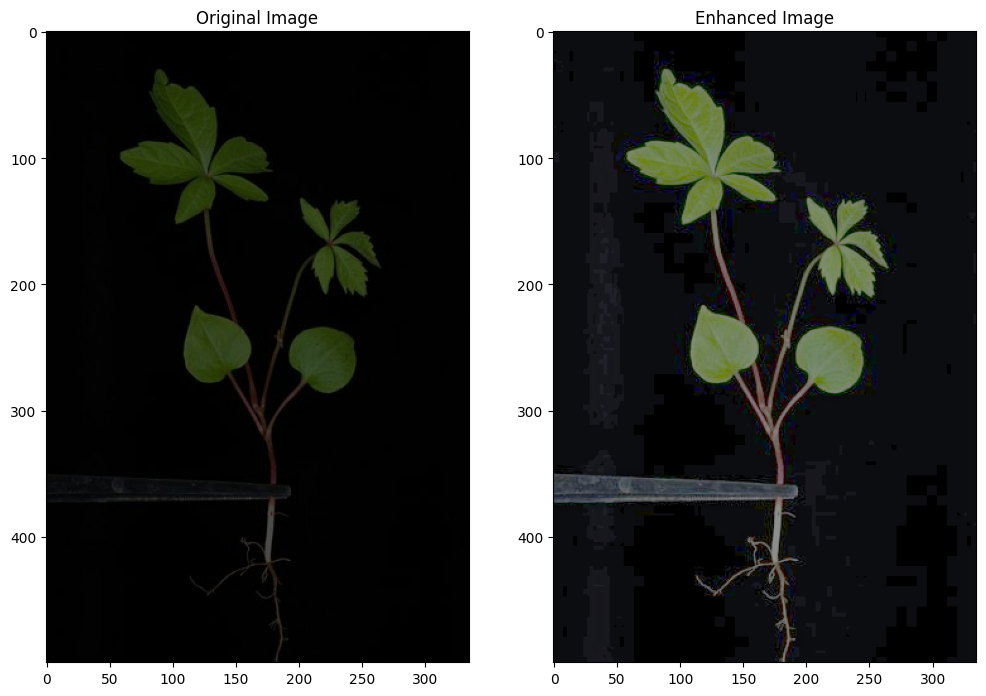

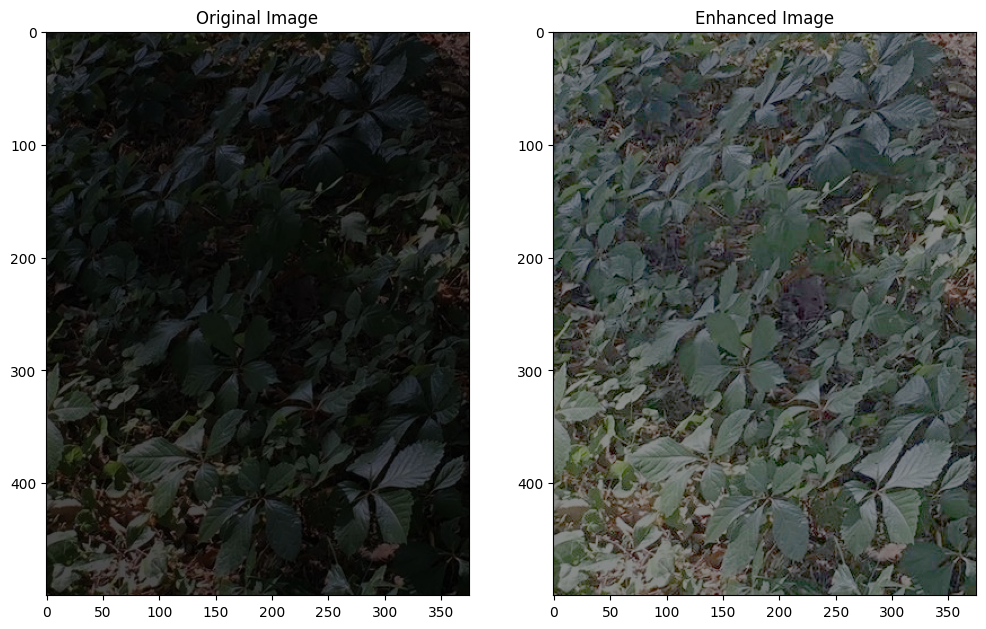

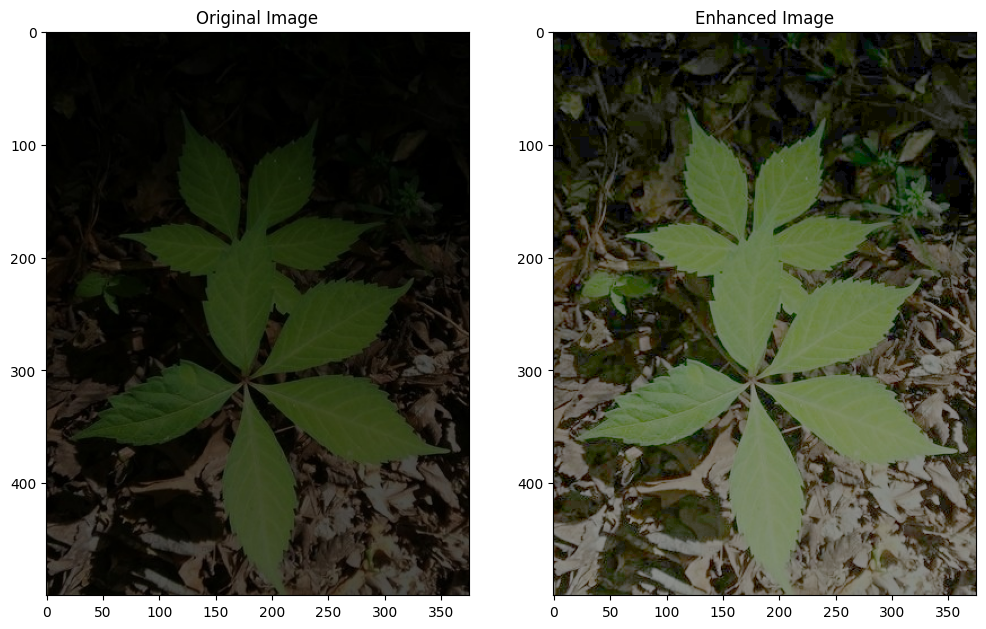

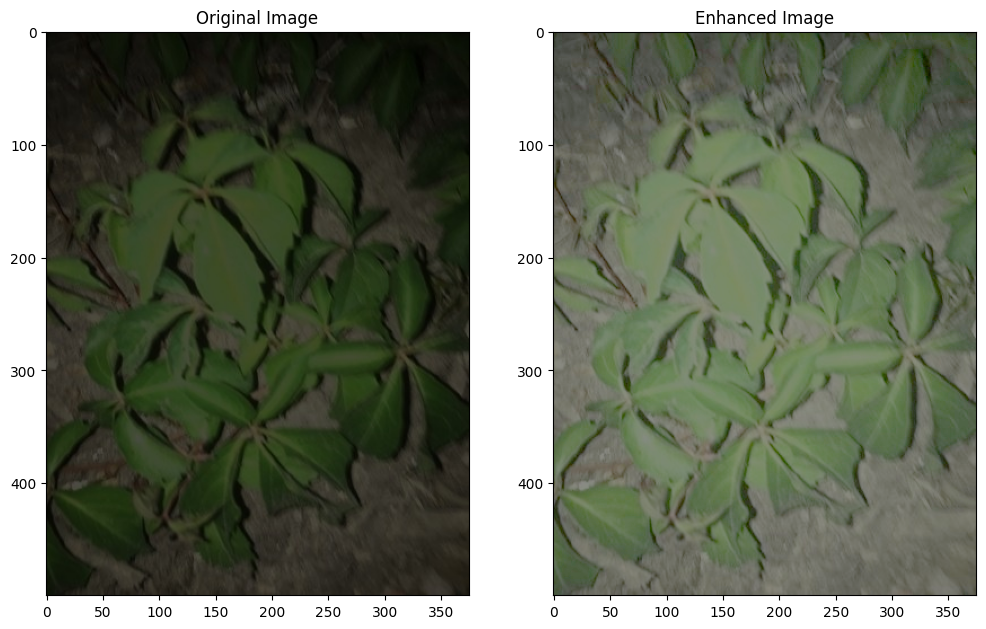

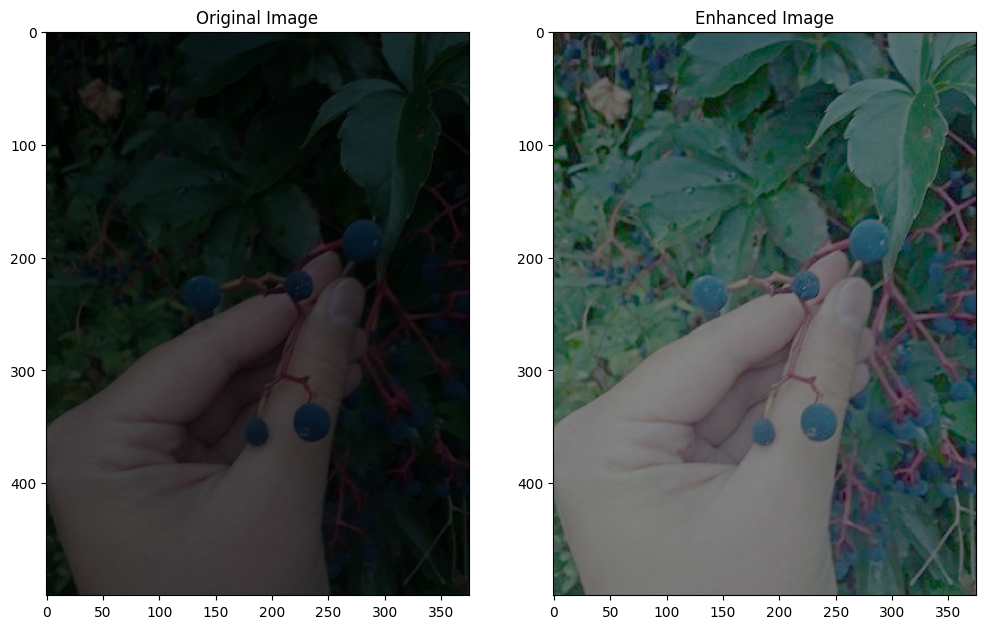

...

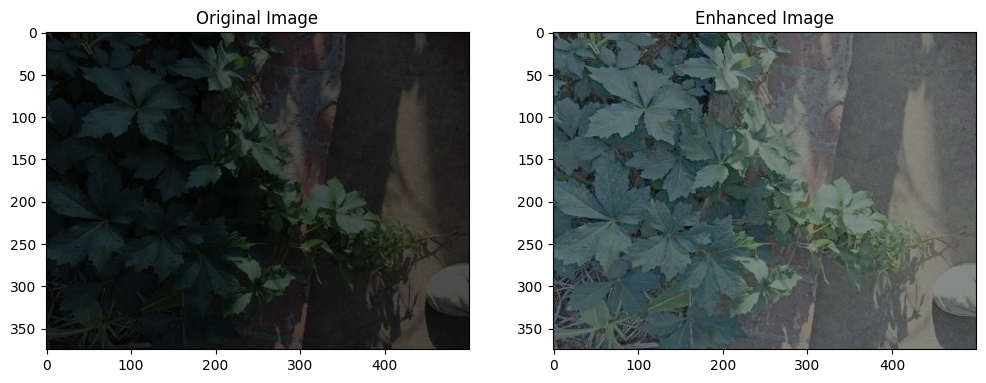

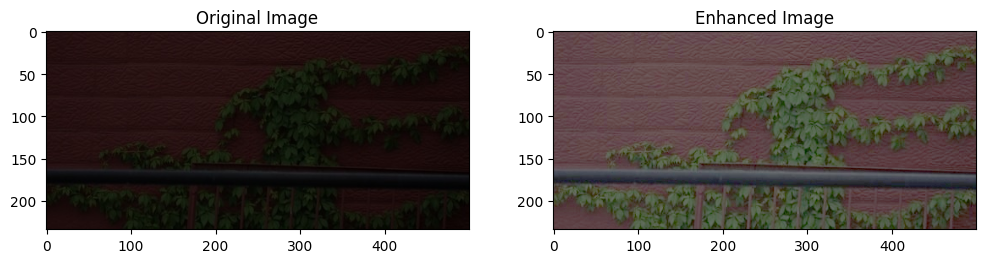

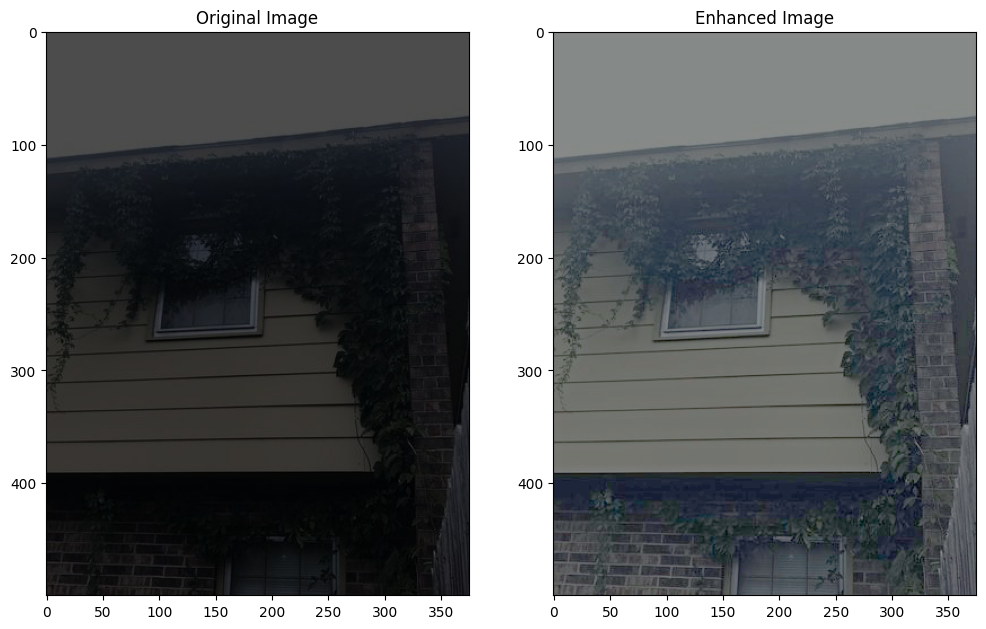

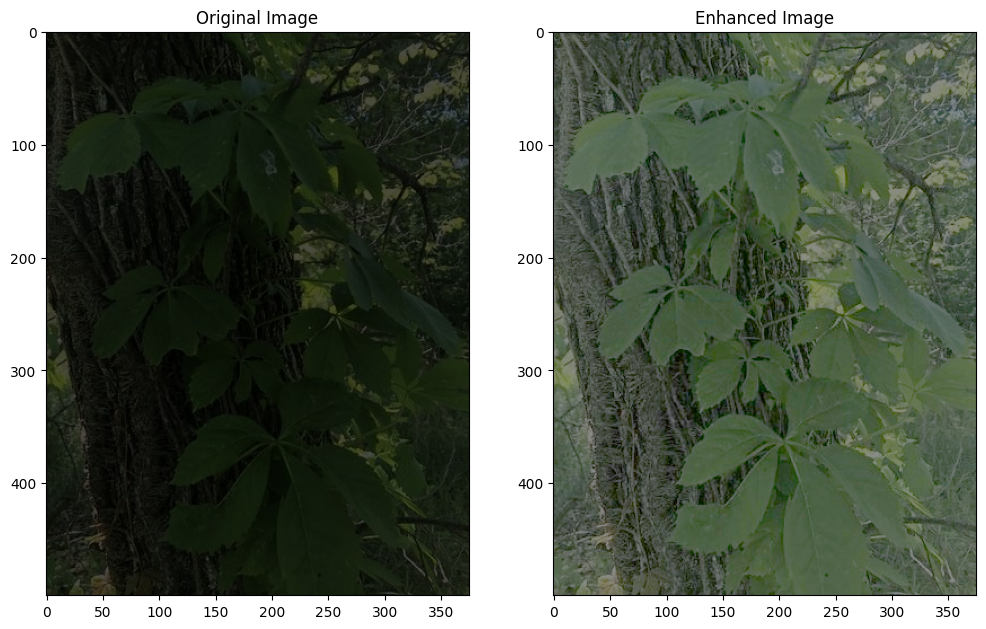

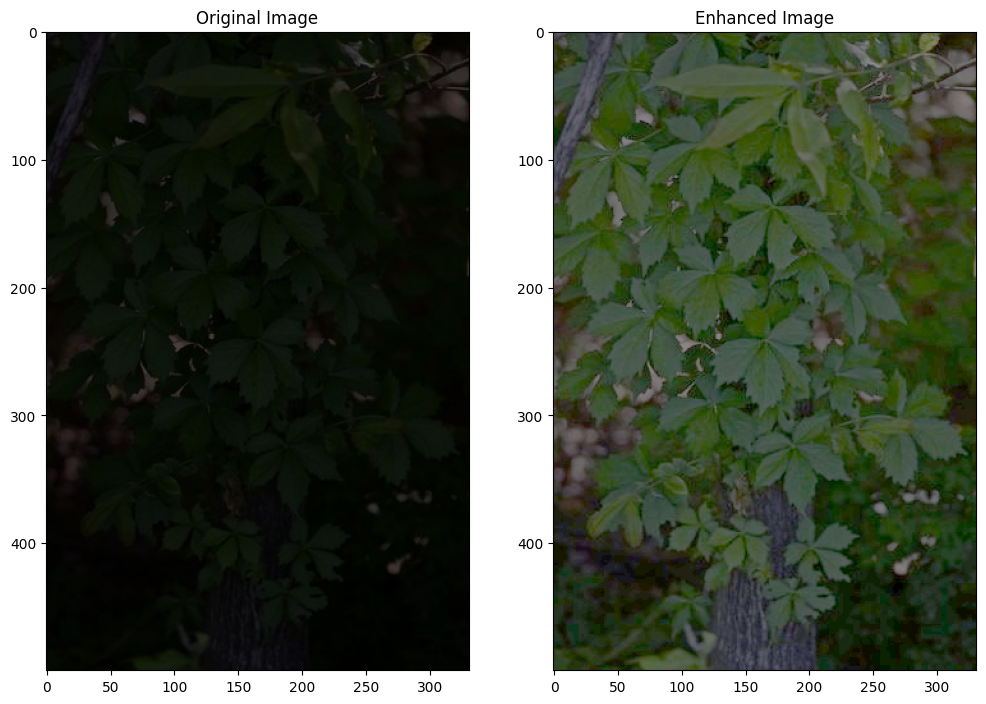

In [46]:
from PIL import Image

if not hasattr(Image, 'ANTIALIAS'):
    Image.ANTIALIAS = Image.Resampling.LANCZOS

for image_file in image_files[:20]:
    image_file = os.path.normpath(image_file)
    image, enhanced = trainer.infer_gpu(image_file, image_resize_factor=1)
    image, enhanced = trainer.infer_gpu(image_file, image_resize_factor=1)
    alpha = 0.4  # try smaller values like 0.3 or even 0.1
    enhanced_toned = alpha * enhanced + (1 - alpha) * np.asarray(image) / 255.0
    enhanced_toned = np.clip(enhanced_toned, 0, 1)
    plot_result(image, enhanced_toned)

In [34]:
import zero_dce.trainer
print(zero_dce.trainer.__file__)


c:\College\Semester 4\Research\Zero-DCE\zero_dce\trainer.py


In [7]:
image_files = glob('./Low/*.png')
random.shuffle(image_files)

In [8]:
for image_file in image_files[:5]:
    # Testing on resized images because I'm gareeb
    image, enhanced = trainer.infer_gpu(image_file, image_resize_factor=1)
    plot_result(image, enhanced)